# Instruction the lab-work #4
`TODO`: make the final .ipynb file in format `"{second_name}_{first_name}_{group_id}__lab_4.ipynb"`

First name     - Volodymyr

Second name    - Donets

Group          - KU-31

# Task description

## Overall description

In this lab work, you will explore how to process sequential data using two distinct neural network paradigms. You will design, train, and evaluate one model constrained to a fixed input size, and a second model architected to handle sequences of variable lengths.


## *Instructions for the work*

1. **Dataset Selection & Preparation**: Choose a sequential dataset that interests you. Perform the necessary data preprocessing (for large datasets, please utilize data generators or tf.data pipelines).
2. **Review Baselines**: Carefully study the provided examples to understand the standard data pipeline and modeling approach.
3. **Fixed-Length Model**: Develop and train a neural network architecture that strictly accepts a constant, fixed input size.
4. **Variable-Length Model**: Develop and train a neural network architecture capable of processing flexible, dynamic input sizes (consider RNN, LSTM, GRU or any other architectures based on this concept).
5. **Evaluation**: Analyze the results and write a conclusion comparing the performance, training speed, and architectural differences between the two models.

## Examples

1. [Audio Classification Tutorial](https://www.digitalocean.com/community/tutorials/audio-classification-with-deep-learning). The provided lab code is heavily based on the first part of this tutorial, adapted for Windows OS (Linux/Mac users should refer directly to the source). The second part of the lab code was custom-developed for this assignment.
## Important

1. **No Single-Cell Solutions**: Do NOT write all your code in a single Jupyter Notebook cell. Your code must be logically separated. Single-cell notebooks will receive a grade of 0. If you need help structuring a notebook, ask the instructor or your peers. Alternatively, you may submit well-structured .py files alongside a .pdf report of your results.
2. **Academic Integrity**: Plagiarism is prohibited. Identical or copied works will automatically receive a grade of 0.
3. **Submission Format**: You are encouraged to solve this assignment in a separate .ipynb file. You may duplicate the provided template, clear the existing solution, and build your own.
4. **Mandatory Conclusions**: A project without a written analytical conclusion is incomplete. Do not forget to summarize your findings at the end of your notebook.

## How to get max num of points without personal work presentation.

As I told you, you can get the maximum mark for all lab works without personal presentation in case of using something different and additional depth of work.
So for this work you can:

1. `Track A`: Architectural Experimentation
Do not just build one simple model for each task. Implement and compare multiple distinct architectures (e.g., compare 1D-CNN and LSTM models with a hybrid CRNN one) to process the sequential data. Document why one performs better than the other.
2. `Track B`: Advanced Data Engineering
Implement complex data preparation pipelines or dimensionality reduction techniques. For example, apply Principal Component Analysis (PCA) to compress your features, or experiment with different audio spectrogram parameters (STFT window sizes) to optimize your inputs before training.
3. `Track C`: High-Complexity Data Domains
Tackle a challenging, real-world sequential data type. Instead of basic numerical arrays, apply your models to raw audio waveforms, Natural Language Processing (text/NLP), or complex multivariate time-series forecasting (e.g., stock market or weather prediction).

# Explanation to the first part

## 1. Why the time dimension is `1491`?

This represents the number of "time steps" or frames in your spectrogram.

Audio is padded/truncated to exactly `48,000` samples (we take `3` seconds with discretization rate of `16_000`).
And take the `frame_length=320` (the size of the window looking at the audio) and `frame_step=32` (how far that window slides forward each time).

TensorFlow calculates the total number of frames using this formula:

$$
Frames= \frac{Total Samples - Frame Length}{Frame Steps} + 1
$$

So considering our configs we have:

$$
(48000−320)/32 + 1 = 47680/32 + 1 = 1491
$$

Because of step size (32) is so small compared to frame length (320), windows overlap by 90%. This gives us very high time resolution (1491 frames for just 3 seconds of audio).

## 2. Why the frequency dimension is `257`?

This represents the number of frequency bins (the y-axis of a spectrogram).

By default, `tf.signal.stft` computes the Fast Fourier Transform (FFT) over the frame_length. However, standard FFT algorithms require the input length to be a power of `2`.

Since we set  `frame_length=320`, TensorFlow automatically pads it up to the next closest power of `2`, which is `512`.

For real-valued audio signals, the FFT produces symmetrical outputs, so TensorFlow only returns the positive frequencies. The mathematical rule for the number of unique bins returned is:

$$
Frequency Bins = \frac{FFT Length}{2} + 1
$$

So, considering our configs we have:

$$
512/2+1=256+1= 257
$$


# Datasets examples

1. [SOUND: Environment Sound Classification 50](https://www.kaggle.com/datasets/mmoreaux/environmental-sound-classification-50)
2. [SOUND: PhysioNet Challenge2016: Heart sound classification](https://www.kaggle.com/datasets/bjoernjostein/physionet-challenge-2016)
3. [SOUND: Heartbeat Sounds](https://www.kaggle.com/datasets/kinguistics/heartbeat-sounds)
4. [SOUND: Audio Cats and Dogs](https://www.kaggle.com/datasets/mmoreaux/audio-cats-and-dogs)
5. [SOUND: Heart and Lung Sounds Dataset (HLS-CMDS)](https://www.kaggle.com/datasets/yasamantorabi/heart-and-lung-sounds-dataset-hls-cmds)
6. [SOUND: UrbanSound8K: 10 Classes](https://www.kaggle.com/datasets/amineipad/urbansound8k-csv)
7. [SOUND: Cat Sound Classification Dataset](https://www.kaggle.com/datasets/yagtapandeya/cat-sound-classification-dataset)
8. [SOUND: Drone Sound Audio Detection](https://www.kaggle.com/datasets/amineipad/drone-sound-audio-detection)
9. [Tesla Stock Price](https://www.kaggle.com/datasets/jillanisofttech/tesla-stock-price)
10. [Stock Price](https://www.kaggle.com/datasets/prashikmeshram37/stock-price)
11. [Google Stock Price](https://www.kaggle.com/datasets/henryshan/google-stock-price)
12. [Gold Price Forecasting Dataset](https://www.kaggle.com/datasets/vishardmehta/gold-price-forecasting-dataset)
13. [Stock Market Simulation Dataset](https://www.kaggle.com/datasets/samayashar/stock-market-simulation-dataset)

# Example 1: working with limited context window (Conv ANN)

## 1.1. Import & install dependencies

In [ ]:
%pip install tensorflow
# %pip install tensorflow-io    # this will work correctly on Linux only
%pip install kaggle
%pip install librosa          # this lib required for tensorflow_io on Windows

In [3]:
import os

import numpy as np
import tensorflow as tf 
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Input
import librosa

from matplotlib import pyplot as plt

## 1.2. Load the data

In [ ]:
# Load the data from Kaggle
!kaggle datasets download kenjee/z-by-hp-unlocked-challenge-3-signal-processing

In [4]:
def load_wav_16k_mono(file_path):
    # 1. If TF passes a 0-D numpy array, extract the underlying Python object
    if hasattr(file_path, 'item'):
        file_path = file_path.item()
    
    # 2. If it is a byte string (which TF string tensors become), decode it
    if isinstance(file_path, bytes):
        file_path = file_path.decode('utf-8')
        
    # 3. Now librosa can safely read the string path
    wav, _ = librosa.load(file_path, sr=16000, mono=True)
    return wav.astype(np.float32)


# --- If you are using this inside a tf.data.Dataset.map() ---
# You will need to wrap it in tf.numpy_function because librosa runs outside the TF graph:
# def tf_load_wav_16k_mono(filename):
#     wav = tf.numpy_function(load_wav_16k_mono, [filename], tf.float32)
#     
#     # Ensure the tensor has a shape (numpy_function forgets shapes)
#     wav.set_shape([None]) 
#     return wav

In [5]:
# Defining the positive and negative paths
POS = os.path.join('src', 'Parsed_Capuchinbird_Clips/*.wav')
NEG = os.path.join('src', 'Parsed_Not_Capuchinbird_Clips/*.wav')

# Creating the Datasets
pos = tf.data.Dataset.list_files(POS)
neg = tf.data.Dataset.list_files(NEG)

# Adding labels
positives = tf.data.Dataset.zip((pos, tf.data.Dataset.from_tensor_slices(tf.ones(len(pos)))))
negatives = tf.data.Dataset.zip((neg, tf.data.Dataset.from_tensor_slices(tf.zeros(len(neg)))))
data = positives.concatenate(negatives)

In [6]:
lengths = []

# Load all audio files and store their lengths
for file in os.listdir(os.path.join('src', 'Parsed_Capuchinbird_Clips')):
    tensor_wave = load_wav_16k_mono(os.path.join('src', 'Parsed_Capuchinbird_Clips', file))
    lengths.append(len(tensor_wave))

# Convert lengths to TensorFlow tensors
lengths_tensor = tf.constant(lengths, dtype=tf.int32)

# Calculate statistics
min_length = tf.reduce_min(lengths_tensor)
mean_length = tf.reduce_mean(lengths_tensor)
max_length = tf.reduce_max(lengths_tensor)

# Display the results
print("Minimum waveform length:", min_length.numpy(), f"duration: {min_length.numpy() / 16_000}s")
print("Mean waveform length:", mean_length.numpy(), f"duration: {mean_length.numpy() / 16_000}s")
print("Maximum waveform length:", max_length.numpy(), f"duration: {max_length.numpy() / 16_000}s")

Minimum waveform length: 32000 duration: 2.0s
Mean waveform length: 54156 duration: 3.38475s
Maximum waveform length: 80000 duration: 5.0s


In [7]:
def preprocess(file_path, data_label): 
    # Wrap the robust loader in tf.numpy_function
    wav = tf.numpy_function(load_wav_16k_mono, [file_path], tf.float32)
    
    # Tell TF it's a 1D array of unknown length so downstream math works
    wav.set_shape([None])
    
    # Slicing and padding
    wav = wav[:48000]  
    zero_padding = tf.zeros([48000] - tf.shape(wav), dtype=tf.float32)
    wav = tf.concat([zero_padding, wav], axis=0)

    # Convert waveform to spectrogram
    # This converts pure sound discretion into spectrogram using Fast Fourier Transformation (FFT)
    spectrogram_wav = tf.signal.stft(wav, frame_length=320, frame_step=32)
    spectrogram_wav = tf.abs(spectrogram_wav)
    spectrogram_wav = tf.expand_dims(spectrogram_wav, axis=2)  # Add channel dimension
    
    return spectrogram_wav, data_label

In [8]:
def plot_spectrogram(spectrogram_wav, data_label):
    # 1. Squeeze out the channel dimension: (1491, 257, 1) -> (1491, 257)
    spec_2d = tf.squeeze(spectrogram_wav, axis=-1).numpy()

    # 2. Transpose so Time is X-axis and Frequency is Y-axis: (257, 1491)
    spec_2d = np.transpose(spec_2d)

    # 3. Convert to log scale (Decibels). We add 1e-6 to avoid taking the log of 0.
    spec_db = 10 * np.log10(spec_2d + 1e-6)

    # 4. Plot the data
    plt.figure(figsize=(16, 5))
    
    # origin='lower' puts the low frequencies at the bottom of the Y-axis
    # aspect='auto' makes sure the plot fits the wide figure size
    plt.imshow(spec_db, aspect='auto', origin='lower', cmap='magma')
    
    plt.title(f"Spectrogram Visualization - Label: {data_label}")
    plt.ylabel("Frequency Bins")
    plt.xlabel("Time Frames")
    plt.colorbar(label='Intensity (dB)')
    
    plt.tight_layout()
    plt.show()

Spectrogram shape: (1491, 257, 1)
Label: 1.0


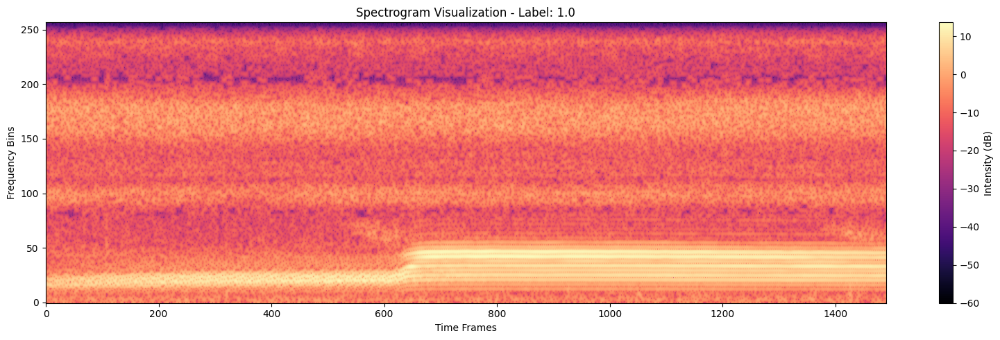

In [9]:
# Shuffle and get a sample
filepath, label = positives.shuffle(buffer_size=10000).as_numpy_iterator().next()
spectrogram, label = preprocess(filepath, label)

print("Spectrogram shape:", spectrogram.shape)
print("Label:", label)

plot_spectrogram(spectrogram, label)

Spectrogram shape: (1491, 257, 1)
Label: 1.0


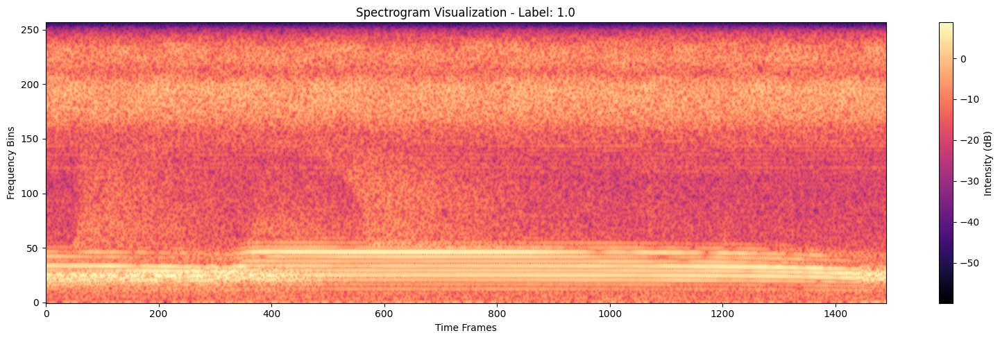

In [21]:
# Shuffle and get a sample
filepath, label = positives.shuffle(buffer_size=10000).as_numpy_iterator().next()
spectrogram, label = preprocess(filepath, label)

print("Spectrogram shape:", spectrogram.shape)
print("Label:", label)

plot_spectrogram(spectrogram, label)

Spectrogram shape: (1491, 257, 1)
Label: 1.0


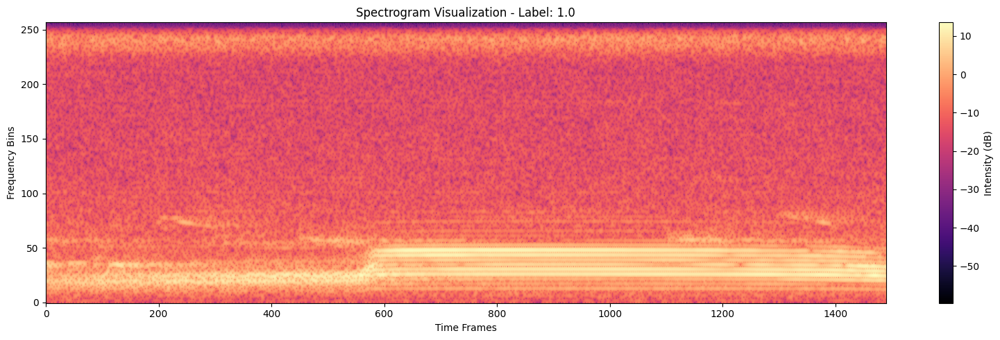

In [22]:
# Shuffle and get a sample
filepath, label = positives.shuffle(buffer_size=10000).as_numpy_iterator().next()
spectrogram, label = preprocess(filepath, label)

print("Spectrogram shape:", spectrogram.shape)
print("Label:", label)

plot_spectrogram(spectrogram, label)

Spectrogram shape: (1491, 257, 1)
Label: 0.0


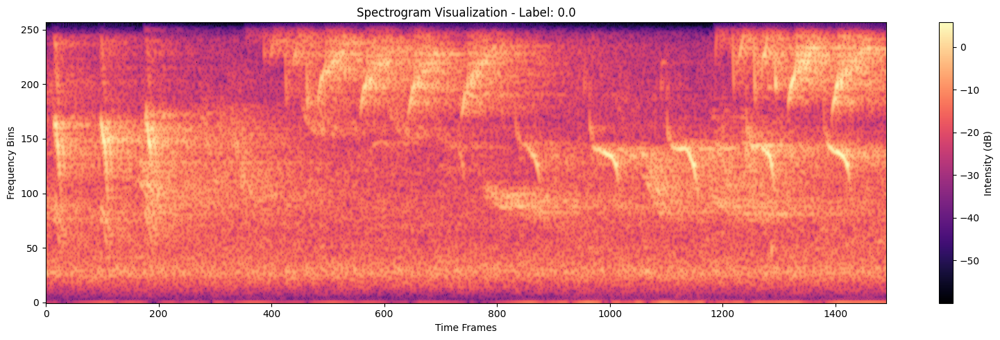

In [19]:
# Shuffle and get a sample
filepath, label = negatives.shuffle(buffer_size=10000).as_numpy_iterator().next()
spectrogram, label = preprocess(filepath, label)

print("Spectrogram shape:", spectrogram.shape)
print("Label:", label)

plot_spectrogram(spectrogram, label)

Spectrogram shape: (1491, 257, 1)
Label: 0.0


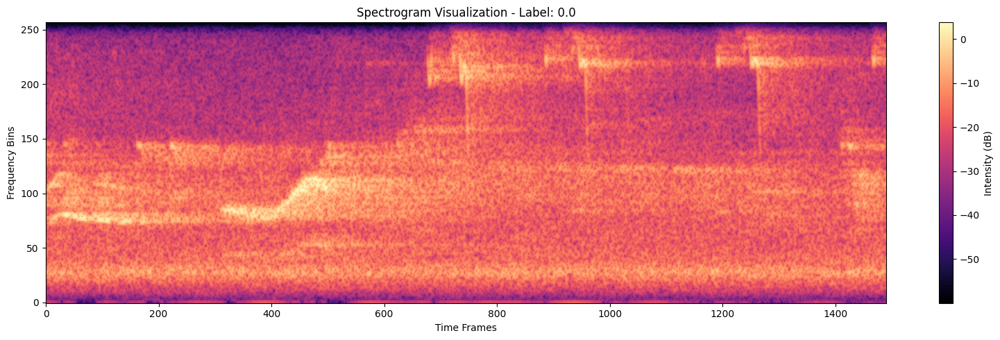

In [20]:
# Shuffle and get a sample
filepath, label = negatives.shuffle(buffer_size=10000).as_numpy_iterator().next()
spectrogram, label = preprocess(filepath, label)

print("Spectrogram shape:", spectrogram.shape)
print("Label:", label)

plot_spectrogram(spectrogram, label)

In [10]:
# Creating a Tensorflow Data Pipeline
data = data.map(preprocess)
data = data.cache()
data = data.shuffle(buffer_size=1000)
data = data.batch(16)
data = data.prefetch(8)

# Split into Training and Testing Partitions
train = data.take(36)
test = data.skip(36).take(15)

## 1.3. Train the Conv model

In [13]:
model = Sequential()
model.add(Input(shape=(1491, 257,1)))
model.add(Conv2D(16, (3,3), strides=(3,3), activation='relu'))
# model.add(MaxPool2D((3,3)))
model.add(Conv2D(16, (3,3), strides=(3,3), activation='relu'))
# model.add(MaxPool2D((3,3)))
model.add(Flatten())
# model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 497, 85, 16)    │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 165, 28, 16)    │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 73920)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │        73,921 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 76,401 (298.44 KB)

 Trainable params: 76,401 (298.44 KB)

 Non-trainable params: 0 (0.00 B)

In [14]:
# Compiling and fitting the model
model.compile('Adam', loss='BinaryCrossentropy', metrics=[tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])

model.fit(train, epochs=4, validation_data=test)

Epoch 1/4
36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.1986 - precision: 0.9097 - recall: 0.8598 - val_loss: 0.0920 - val_precision: 0.9828 - val_recall: 0.9828
Epoch 2/4
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0687 - precision: 0.9733 - recall: 0.9542 - val_loss: 0.0600 - val_precision: 0.9828 - val_recall: 0.9828
Epoch 3/4
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0381 - precision: 0.9870 - recall: 0.9806 - val_loss: 0.0146 - val_precision: 1.0000 - val_recall: 0.9836
Epoch 4/4
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0189 - precision: 0.9869 - recall: 0.9869 - val_loss: 0.0272 - val_precision: 1.0000 - val_recall: 0.9706


# Example 2: Using LSTM for analyzing entire sound with LSTM

## 2.1. Import dependencies

In [12]:
import os

import numpy as np
import tensorflow as tf 
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Input, LSTM, Dense, Masking
import librosa

from matplotlib import pyplot as plt

# 2.2. Load & Prepare the data

In [2]:
def load_wav_16k_mono(file_path):
    # 1. If TF passes a 0-D numpy array, extract the underlying Python object
    if hasattr(file_path, 'item'):
        file_path = file_path.item()
    
    # 2. If it is a byte string (which TF string tensors become), decode it
    if isinstance(file_path, bytes):
        file_path = file_path.decode('utf-8')
        
    # 3. Now librosa can safely read the string path
    wav, _ = librosa.load(file_path, sr=16000, mono=True)
    return wav.astype(np.float32)

In [7]:
# Defining the positive and negative paths
POS = os.path.join('src', 'Parsed_Capuchinbird_Clips/*.wav')
NEG = os.path.join('src', 'Parsed_Not_Capuchinbird_Clips/*.wav')

# Creating the Datasets
pos = tf.data.Dataset.list_files(POS)
neg = tf.data.Dataset.list_files(NEG)

pos_count = len(os.listdir(os.path.join('src', 'Parsed_Capuchinbird_Clips')))
neg_count = len(os.listdir(os.path.join('src', 'Parsed_Not_Capuchinbird_Clips')))

# Adding labels
positives = tf.data.Dataset.zip((pos, tf.data.Dataset.from_tensor_slices(tf.ones(len(pos)))))
negatives = tf.data.Dataset.zip((neg, tf.data.Dataset.from_tensor_slices(tf.zeros(len(neg)))))
data_path = positives.concatenate(negatives)

In [4]:
lengths = []

# Load all audio files and store their lengths
for file in os.listdir(os.path.join('src', 'Parsed_Capuchinbird_Clips')):
    tensor_wave = load_wav_16k_mono(os.path.join('src', 'Parsed_Capuchinbird_Clips', file))
    lengths.append(len(tensor_wave))
    
for file in os.listdir(os.path.join('src', 'Parsed_Not_Capuchinbird_Clips')):
    tensor_wave = load_wav_16k_mono(os.path.join('src', 'Parsed_Not_Capuchinbird_Clips', file))
    lengths.append(len(tensor_wave))

# Convert lengths to TensorFlow tensors
lengths_tensor = tf.constant(lengths, dtype=tf.int32)

# Calculate statistics
min_length = tf.reduce_min(lengths_tensor)
mean_length = tf.reduce_mean(lengths_tensor)
max_length = tf.reduce_max(lengths_tensor)

# Display the results
print("Minimum waveform length:", min_length.numpy(), f"duration: {min_length.numpy() / 16_000}s")
print("Mean waveform length:", mean_length.numpy(), f"duration: {mean_length.numpy() / 16_000}s")
print("Maximum waveform length:", max_length.numpy(), f"duration: {max_length.numpy() / 16_000}s")

Minimum waveform length: 32000 duration: 2.0s
Mean waveform length: 50599 duration: 3.1624375s
Maximum waveform length: 80000 duration: 5.0s


In [5]:
def preprocess_lstm(file_path, data_label): 
    # Wrap the robust loader in tf.numpy_function
    wav = tf.numpy_function(load_wav_16k_mono, [file_path], tf.float32)
    
    # Tell TF it's a 1D array of unknown length so downstream math works
    wav.set_shape([None])

    # Convert waveform to spectrogram
    # This converts pure sound discretion into spectrogram using Fast Fourier Transformation (FFT)
    spectrogram_wav = tf.signal.stft(wav, frame_length=320, frame_step=32)
    spectrogram_wav = tf.abs(spectrogram_wav)
    
    return spectrogram_wav, data_label

In [6]:
def plot_spectrogram(spectrogram_wav, data_label):
    spec_2d = spectrogram_wav

    # 2. Transpose so Time is X-axis and Frequency is Y-axis: (257, 1491)
    spec_2d = np.transpose(spec_2d)

    # 3. Convert to log scale (Decibels). We add 1e-6 to avoid taking the log of 0.
    spec_db = 10 * np.log10(spec_2d + 1e-6)

    # 4. Plot the data
    plt.figure(figsize=(16, 5))
    
    # origin='lower' puts the low frequencies at the bottom of the Y-axis
    # aspect='auto' makes sure the plot fits the wide figure size
    plt.imshow(spec_db, aspect='auto', origin='lower', cmap='magma')
    
    plt.title(f"Spectrogram Visualization - Label: {data_label}")
    plt.ylabel("Frequency Bins")
    plt.xlabel("Time Frames")
    plt.colorbar(label='Intensity (dB)')
    
    plt.tight_layout()
    plt.show()

Spectrogram shape: (1741, 257)
Label: 1.0


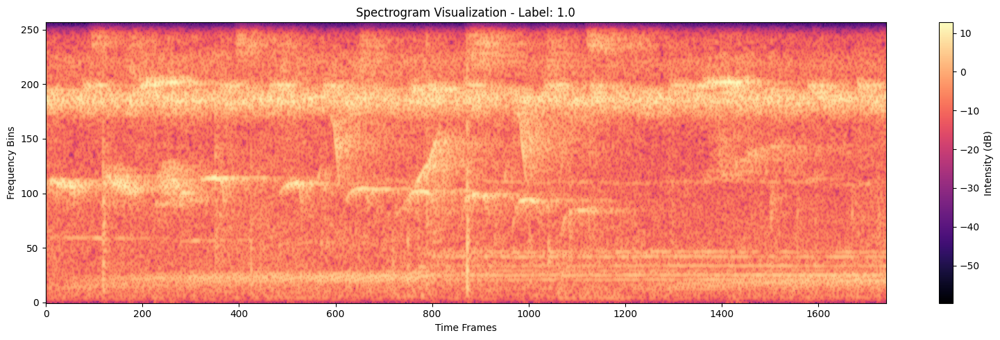

In [7]:
# Shuffle and get a sample
filepath, label = positives.shuffle(buffer_size=10000).as_numpy_iterator().next()
spectrogram, label = preprocess_lstm(filepath, label)

print("Spectrogram shape:", spectrogram.shape)
print("Label:", label)

plot_spectrogram(spectrogram, label)

Spectrogram shape: (1491, 257, 1)
Label: 1.0


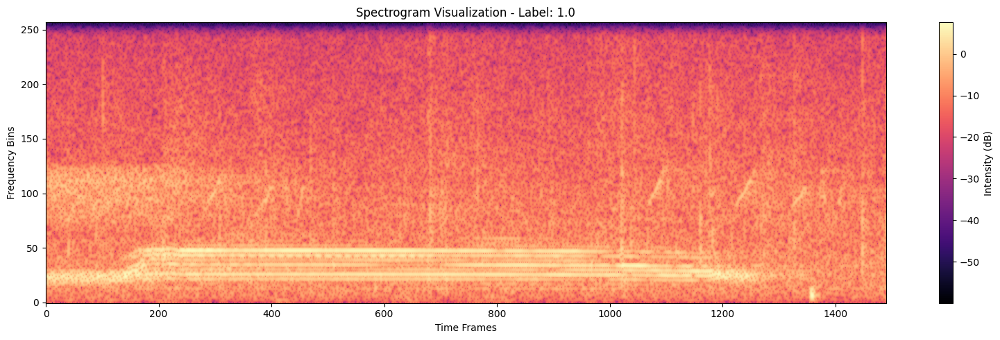

In [24]:
# Shuffle and get a sample
filepath, label = positives.shuffle(buffer_size=10000).as_numpy_iterator().next()
spectrogram, label = preprocess_lstm(filepath, label)

print("Spectrogram shape:", spectrogram.shape)
print("Label:", label)

plot_spectrogram(spectrogram, label)

Spectrogram shape: (1567, 257, 1)
Label: 0.0


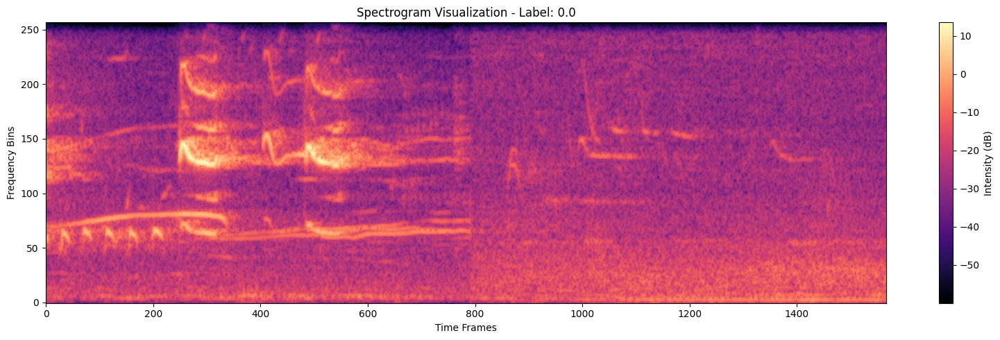

In [28]:
# Shuffle and get a sample
filepath, label = negatives.shuffle(buffer_size=10000).as_numpy_iterator().next()
spectrogram, label = preprocess_lstm(filepath, label)

print("Spectrogram shape:", spectrogram.shape)
print("Label:", label)

plot_spectrogram(spectrogram, label)

Spectrogram shape: (1491, 257, 1)
Label: 1.0


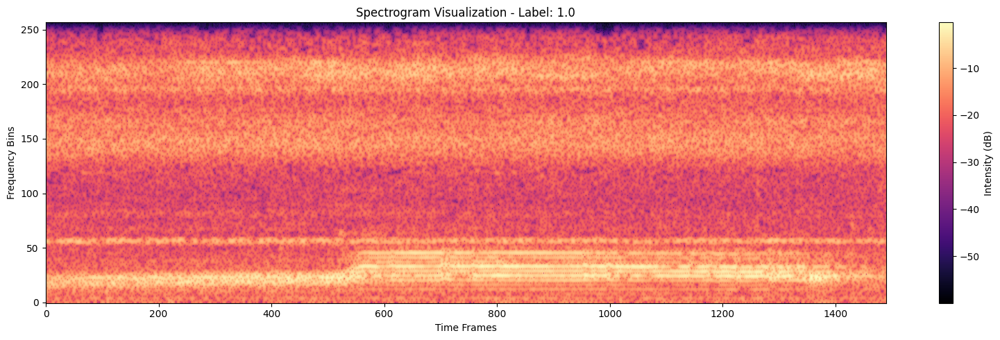

In [29]:
# Shuffle and get a sample
filepath, label = positives.shuffle(buffer_size=10000).as_numpy_iterator().next()
spectrogram, label = preprocess_lstm(filepath, label)

print("Spectrogram shape:", spectrogram.shape)
print("Label:", label)

plot_spectrogram(spectrogram, label)

In [8]:
# The Unpadded Dataflow
# Map the function across your existing dataset
data = data_path.map(preprocess_lstm, num_parallel_calls=tf.data.AUTOTUNE)

data = data.cache()
data = data.shuffle(buffer_size=1000)

# Standard batch of 1. NO padded_batch required. 
# Output shape will naturally be (1, variable_time_steps, 257)
data = data.batch(1) 
data = data.prefetch(tf.data.AUTOTUNE)


# Calculate your 70/30 (or similar) split based on the total file count
total_files = pos_count + neg_count
train_size = int(total_files * 0.7)
test_size = total_files - train_size

# Since batch size is 1, take() pulls individual files
train = data.take(train_size)
test = data.skip(train_size).take(test_size)

## 2.3. Build & Train the LSTM model

In [9]:
model = Sequential([
    # Notice the shape: (None, 257)
    # "None" tells TensorFlow: "The time dimension can be any length!"
    Input(shape=(None, 257)),
    
    # The LSTM processes the sequence, ignoring the masked zeros, 
    # and outputs one final thought when the sequence actually ends.
    LSTM(units=128, return_sequences=False),
    
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 128)            │       197,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 205,953 (804.50 KB)

 Trainable params: 205,953 (804.50 KB)

 Non-trainable params: 0 (0.00 B)

In [10]:
model.compile(
    optimizer='adam', 
    loss='binary_crossentropy', 
    # Accuracy is good, but Recall/Precision are essential for audio event detection
    metrics=['accuracy', tf.keras.metrics.Recall(), tf.keras.metrics.Precision()] 
)

In [11]:
history = model.fit(
    train, 
    epochs=10,
    validation_data=test,
)

Epoch 1/10
567/567 ━━━━━━━━━━━━━━━━━━━━ 165s 283ms/step - accuracy: 0.8519 - loss: 0.3672 - precision: 0.7955 - recall: 0.6481 - val_accuracy: 0.9300 - val_loss: 0.1929 - val_precision: 0.8000 - val_recall: 0.9677
Epoch 2/10
567/567 ━━━━━━━━━━━━━━━━━━━━ 159s 281ms/step - accuracy: 0.9206 - loss: 0.2154 - precision: 0.8302 - recall: 0.8800 - val_accuracy: 0.9259 - val_loss: 0.2259 - val_precision: 0.9661 - val_recall: 0.7808
Epoch 3/10
567/567 ━━━━━━━━━━━━━━━━━━━━ 147s 259ms/step - accuracy: 0.9471 - loss: 0.1586 - precision: 0.9197 - recall: 0.8690 - val_accuracy: 0.9547 - val_loss: 0.1857 - val_precision: 0.9773 - val_recall: 0.8113
Epoch 4/10
567/567 ━━━━━━━━━━━━━━━━━━━━ 162s 286ms/step - accuracy: 0.9541 - loss: 0.1446 - precision: 0.9145 - recall: 0.9145 - val_accuracy: 0.9753 - val_loss: 0.0572 - val_precision: 0.9833 - val_recall: 0.9219
Epoch 5/10
567/567 ━━━━━━━━━━━━━━━━━━━━ 149s 263ms/step - accuracy: 0.9788 - loss: 0.0641 - precision: 0.9481 - recall: 0.9733 - val_accuracy: 0

## 2.4. Fast LSTM training with Masking & Padded batch

In [13]:
# README: Use it in case of using Masking
# # Creating a Tensorflow Data Pipeline

data = data_path.map(preprocess_lstm)
data = data.cache()
data = data.shuffle(buffer_size=1000)
# padded_shapes tells TF: "Pad the Time dimension (None), but Frequency is always 257. Labels are scalars ()."
data = data.padded_batch(16, padded_shapes=([None, 257], []))
data = data.prefetch(8)

# Split into Training and Testing Partitions
train = data.take(36)
test = data.skip(36).take(15)

In [14]:
# README: this variant allows using Masking, which theoretically might improve speed of training.

model = Sequential([
    # Notice the shape: (None, 257)
    # "None" tells TensorFlow: "The time dimension can be any length!"
    Input(shape=(None, 257)),

    # This tells the model to completely ignore padded zero-frames
    Masking(mask_value=0.0),

    # The LSTM processes the sequence, ignoring the masked zeros, 
    # and outputs one final thought when the sequence actually ends.
    LSTM(128, return_sequences=False),

    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid')
])

In [15]:
model.compile(
    optimizer='adam', 
    loss='binary_crossentropy', 
    # Accuracy is good, but Recall/Precision are essential for audio event detection
    metrics=['accuracy', tf.keras.metrics.Recall(), tf.keras.metrics.Precision()] 
)

In [16]:
history = model.fit(
    train, 
    epochs=50,
    validation_data=test,
)

Epoch 1/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 33s 703ms/step - accuracy: 0.8993 - loss: 0.3289 - precision_1: 0.8923 - recall_1: 0.7250 - val_accuracy: 0.9444 - val_loss: 0.1857 - val_precision_1: 0.8590 - val_recall_1: 0.9710
Epoch 2/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 25s 686ms/step - accuracy: 0.9410 - loss: 0.1923 - precision_1: 0.9302 - recall_1: 0.8276 - val_accuracy: 0.9658 - val_loss: 0.1311 - val_precision_1: 0.9608 - val_recall_1: 0.8909
Epoch 3/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 25s 683ms/step - accuracy: 0.9514 - loss: 0.1638 - precision_1: 0.9042 - recall_1: 0.9264 - val_accuracy: 0.9530 - val_loss: 0.1533 - val_precision_1: 0.9104 - val_recall_1: 0.9242
Epoch 4/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 25s 703ms/step - accuracy: 0.9444 - loss: 0.1464 - precision_1: 0.8824 - recall_1: 0.9259 - val_accuracy: 0.9701 - val_loss: 0.1252 - val_precision_1: 0.9483 - val_recall_1: 0.9322
Epoch 5/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 25s 694ms/step - accuracy: 0.9358 - loss: 0.1594 - precision_1: 0.8854 - recall_1: 0.8